In [1]:
import numpy
from IPython.display import Image
from matplotlib import pyplot
from gaussians import Gaussian1d, Mixture1d
%matplotlib inline

def psf_pixel():
    pyplot.figure(figsize=(16,8))
    x = numpy.arange(-0.495, 10.5, 0.01)
    T = Gaussian1d(sigma=0.7)
    f = 1.0*Gaussian1d(mu=4.3, sigma=0.6) + 2.0*Gaussian1d(mu=6, sigma=1)
    Tf = T.convolve(f)
    ax1 = pyplot.subplot(1,2,1)
    ax1.plot(x, f(x), label="f")
    ax1.plot(x, Tf(x), label="f * T")
    kx = numpy.arange(-2.995, 3.0, 0.01)
    H = numpy.zeros_like(kx)
    H[numpy.abs(kx) < 0.5] = 1.0
    Tfi = numpy.zeros(11, dtype=float)
    for n in range(0, 11):
        mask = numpy.logical_and(x > n - 0.5, x < n + 0.5)
        Tfi[n] = numpy.sum(Tf(x)[mask]) * 0.01
    xi = numpy.arange(0, 11, 1, dtype=int)
    ax1.bar(xi-0.5, Tfi, width=1.0, fill=False)
    THf = numpy.convolve(H, Tf(x), mode='same')
    TH = numpy.convolve(H, T(kx), mode='same')
    ax1.plot(x, THf * 0.01, label="f * T * H")
    ax1.legend()
    ax2 = pyplot.subplot(1,2,2)
    ax2.plot(kx, T(kx), label="T")
    ax2.plot(kx, H, label="H")
    ax2.plot(kx, TH * 0.01, label="T * H")
    ax2.legend()

# Algorithms for Detection and Coaddition

LSST Tech Talk

Jim Bosch

Princeton University

July 21, 2015

## Outline
- Image Statistics, Sampling, and Interpolation
- Single-Epoch Detection
- Direct Coaddition
- PSF-Matched Coaddition
- Likelihood (Kaiser) Coaddition

### Out of Scope
 - Chromatic Effects
 - Background Estimation
 - Detector Anomolies (e.g. Brighter-Fatter)
 - Undersampled Images

## Noise in Astronomical Images

The probability of getting $n$ photons in a pixel during an exposure of time $t$, given an average rate $v$ from sources and $b$ from the background, is Poisson:

$$ P(n|v,b,t) = \frac{((v+b)t)^n e^{-(v+b)t}}{n!} $$

We're essentially always in a regime where the number of photons is large (even with LSST's short exposures), so we can approximate this as Gaussian:

$$ P(n|v,b,t) \approx \frac{1}{\sqrt{2\pi(v+b)t}}e^{-\frac{(n - (v+b)t)^2}{2(v+b)t}} $$

There's also read noise from the amplifiers with RMS $\sigma_r$, which we'll just add in quadrature:

$$ P(n|v,b,t,\sigma_r) \approx \frac{1}{\sqrt{2\pi((v+b)t + \sigma_r^2)}}e^{-\frac{(n - vt)^2}{2((v+b)t + \sigma_r^2)}} $$

Considering the "signal" to be the average number of photons from the source $vt$, the signal-to-noise ratio is

$$ \mathrm{SNR} = \frac{vt}{\sqrt{(v+b)t + \sigma_r^2}} $$

## Noise Regimes

- $\sigma_r^2 \gg (v+b)t$: Read-noise-dominated.  We almost always observe long enough that we're not in this regime, because while this is true SNR scales as $t$, much better than the $\sqrt{t}$ we get later.

- $v \gg b$: Object-dominated.  For the very brightest objects, the photons from the object outnumber the photons from the background, and hence the pixel noise is a function of position.

- $v \ll b$: Sky-dominated.  The background contributes many more photons per pixel than most objects, and for these we can approximate the pixel noise as independent of position.

## Noise Correlations

Pixel noise is almost uncorrelated on single-epoch images, simply because each pixel sees an entirely different set of photons.  Why isn't it exactly uncorrelated?

 - instrument signature removal: arithmetic operations involving imperfectly-known numbers

 - detector electronic effects (crosstalk, BF)

 - undetected sources

## Point Spread Functions and Pixels: 1-d

The noise-free flux $I$ in a pixel is related to the true sky intensity $f(x)$ via a convolution with the point spread function (PSF), which I'll call $T(x)$, and then an integration over the pixel, which we'll define as a segment of width $a$ centered at $x$:

$$ I(x) = \int_{x-\frac{a}{2}}^{x+\frac{a}{2}} dv
\int_{-\infty}^{\infty} du\,f(u)\,T(v-u) $$

We can also write the integral over the pixel area as another convolution, this time with a top hat $H_a(x)$:
<div style="font-size: 78%;">
$$ I(x) = \int_{-\infty}^{\infty} dv\,H_a(x-v)
\int_{-\infty}^{\infty} du\,f(u)\,T(v-u) = [H_a \ast (f \ast T)](x)$$
</div>

Because convolution is associative and commutative, we can also write this as:

$$ I(x) = [f \ast (T \ast H_a)](x) = [f \ast T_a](x) $$

with

$$ T_a(x) = [T \ast H_a](x) $$

In other words, we can include the pixel transfer function in the PSF.  In fact, when we measure the PSF from star images, the pixel transfer function is included automatically, and for the rest of this talk, I'll redefine $T(x) \equiv T_a(x)$ and just assume the PSF includes the pixel term.  And that means we should think of our pixel data as a noisy *sampling* of the true (albeit PSF-convolved) sky.

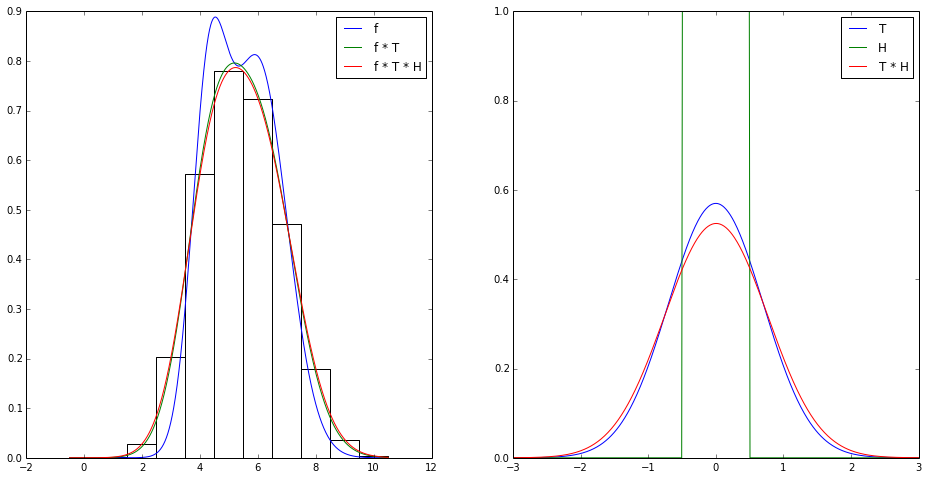

In [2]:
psf_pixel()

## Point Spread Functions and Pixels: 2-d

Nothing changes!

(Just make sure you use a square top hat for $H_a$, not a circular one).

## Sinc Interpolation

Convolution with the PSF guarantees that the signal is band-limited - there are no features below a certain spatial scale.  For ground-based telescopes, we almost always ensure that our pixel size is less than half that scale.

That means - in the absense of noise - [we could *exactly* reconstruct](https://en.wikipedia.org/wiki/Nyquist%E2%80%93Shannon_sampling_theorem) the continuous function $I(\mathbf{x})$ at any position from our discrete samples $I(\mathbf{x}^{(n)})$ (separated by a distance $\mathbf{a}$) using sinc interpolation:

$$ \sum_{n=-\infty}^{\infty} I(\mathbf{x}^{(n)})\,\frac{\sin\!\left(\pi\frac{\mathbf{x} - \mathbf{x}^{(n)}}{\mathbf{a}}\right)}{\pi\frac{\mathbf{x} - \mathbf{x}^{(n)}}{\mathbf{a}}} = \sum_{n=-\infty}^{\infty} I(\mathbf{x}^{(n)})\,\mathrm{sinc}\!\left(\frac{\mathbf{x} - \mathbf{x}^{(n)}}{\mathbf{a}}\right)$$

In the presence of noise, this is still the optimal interpolant, but it's not practical due to those infinite summation limits.

## Lanczos Interpolation

The most popular practical alternative to sinc interpolation is [Lanczos interpolation](https://en.wikipedia.org/wiki/Lanczos_resampling), which looks like this:

$$ \sum_{n=\lfloor\mathbf{x}\rfloor+1-M}^{\lfloor\mathbf{x}\rfloor + M} I(\mathbf{x}^{(n)})\,\mathrm{sinc}\!\left(\frac{\mathbf{x} - \mathbf{x}^{(n)}}{\mathbf{a}}\right)\,\mathrm{sinc}\!\left(\frac{\mathbf{x} - \mathbf{x}^{(n)}}{M\mathbf{a}}\right) $$

where $M$ is a positive number, typically between 2 and 5; greater $M$ is better (closer to sinc), but slower.  The extra sinc function gives the Lanczos kernel continuous derivatives even at $\pm M$, where it goes to zero, which is what makes it a better choice than a more naively windowed sinc function.

## Resampling Debunking

 - Sinc interpolation on samples with IID noise *can* produce results with correlated noise - but it doesn't if the resampling is purely an offset (obviously, resampling to a finer pixel grid has to correlate pixels).
 - Neither Lanczos nor sinc resampling will preserve the sum of the pixels of an image.  Of course, after sinc resampling, you'll still be able to recover the integral of the underlying continuous function - but that's not the same as the sum of the samples.

 - Having pixels that aren't rectangular on the sky isn't really a problem.  As long as they're rectangular in *some* coordinate system that can be mapped to the sky with an affine transform, and that affine transform is constant over the scale of the interpolation kernel, our ability to resample is not affected.
 - You should never evaluate a model by integrating over the pixels if you're going to compare it to a resampled image, because those pixel values don't represent integrals over the pixel area.

# Next Up: Detection

Any questions on pixel noise, PSFs, or resampling?

## Likelihood for Pixel Data

Given pixel data $I(\mathbf{x}^{(i)})$, and pixel covariance matrix $C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})$, and a model for the ideal, above-the-atmosphere sky $f(\mathbf{x})$, the log likelihood is:

<div style="font-size: 80%;">
$$
\begin{align}
L \equiv& \;\ln\!\left(P(I|f)\right)\\
=& \;
\frac{1}{2}\sum_{i,j} \frac{
\left(
    I(\mathbf{x}^{(i)}) - [f \ast T](\mathbf{x}^{(i)})
\right)
\left(
    I(\mathbf{x}^{(j)}) - [f \ast T](\mathbf{x}^{(j)})
\right)
}{C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})}
\end{align}
$$
</div>

## Point Source Detection

Let's assume the region of sky we care about has exactly one point source with flux $\alpha$ at position $\mathbf{y}$: $$f(\mathbf{x}) \equiv \alpha\delta(\mathbf{x}-\mathbf{y})$$

The log likelihood is then:
<div style="font-size: 80%;">
$$
\begin{align}
L(\alpha,\mathbf{y}) =& \frac{1}{2}\sum_{i,j} \frac{
\left(
    I(\mathbf{x}^{(i)}) - \alpha T(\mathbf{x}^{(i)}-\mathbf{y})
\right)
\left(
    I(\mathbf{x}^{(j)}) - \alpha T(\mathbf{x}^{(j)}-\mathbf{y})
\right)
}{C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})}\\
=&
\frac{1}{2}\sum_{i,j}\frac{
    I(\mathbf{x}^{(i)})\,I(\mathbf{x}^{(i)})
}{
    C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})
}
-\alpha\sum_{i,j}\frac{
    I(\mathbf{x}^{(i)})\,T(\mathbf{x}^{(j)}-\mathbf{y})
}{
    C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})
}\\
&\quad+\frac{\alpha^2}{2}\sum_{i,j} \frac{
    T(\mathbf{x}^{(i)}-\mathbf{y})\,T(\mathbf{x}^{(j)}-\mathbf{y})
}{
    C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})
}
\end{align}
$$
</div>

Let's ignore the constant term $K$, and rewrite that as
$$
L(\alpha,\mathbf{y}) = \alpha\,\Psi(\mathbf{y}) + \frac{\alpha^2}{2}\Phi(\mathbf{y})
$$
with
$$
\begin{align}
\Psi(\mathbf{y}) \equiv& 
\sum_{i,j}\frac{
      I(\mathbf{x}^{(i)})\,T(\mathbf{x}^{(j)}-\mathbf{y})
}{
    C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})
}\\
\Phi(\mathbf{y}) \equiv&
\sum_{i,j} \frac{
    T(\mathbf{x}^{(i)}-\mathbf{y})\,T(\mathbf{x}^{(j)}-\mathbf{y})
}{
    C(\mathbf{x}^{(i)},\mathbf{x}^{(j)})
}
\end{align}
$$

Now we'll solve for the maximum likelihood value of the flux $\alpha_\mathrm{ML}$, given $\mathbf{y}$:

$$
\frac{\partial L}{\partial \alpha} = -\Psi(\mathbf{y}) + \alpha \Phi(\mathbf{y}) = 0
$$
so
$$
\alpha_{\mathrm{ML}} = \frac{\Psi(\mathbf{y})}{\Phi(\mathbf{y})}
$$
and
$$
L(\alpha_{\mathrm{ML}},\mathbf{y}) = -\frac{\Psi^2\!(\mathbf{y})}{2 \Phi(\mathbf{y})}
$$

In other words, the likelihood of there being a point source at $\mathbf{y}$ is a Gaussian with standard deviation 
$$\nu(\mathbf{y})=\frac{\Psi(\mathbf{y})}{\sqrt{\Phi(\mathbf{y})}}$$

If we could make an image of $\nu$, the points above some threshold $m$ would be $m$-sigma detections.

If the pixel noise is IID with standard deviation $\sigma$, making an image of the significance $\nu$ is easy, because
$$
\begin{align}
\Psi(\mathbf{y}) =& 
\frac{1}{\sigma^2}\sum_{i}
    I(\mathbf{x}^{(i)})\,T(\mathbf{x}^{(i)}-\mathbf{y})
    =\frac{1}{\sigma^2}\,[I \star T](\mathbf{y}) \\
\Phi(\mathbf{y}) =&\frac{1}{\sigma^2}\sum_{i}\left(
    T(\mathbf{x}^{(i)}-\mathbf{y})
\right)^2
 = \frac{1}{\sigma^2\,n_{\mathrm{eff}}(\mathbf{y})}\\
\nu(\mathbf{y}) =& \frac{\sqrt{n_{\mathrm{eff}}}}{\sigma}\,[I \star T](\mathbf{y})
\end{align}
$$
Here $I \star T$ is the cross-correlation of the PSF with the data (equivalent to a convolution if the PSF is symmetric), and $n_\mathrm{eff}$ is the effective area of the PSF model.

## Extended Source Detection

Detecting extended sources is easy in theory: set $f(\mathbf{x})$ to something more extended than a delta function, which in the simplified case above just means smoothing the image with a that matches the profile, size, and orientation of the sources we want to detect.

Obviously, we can't create significance images for all possible morphologies, so in practice we'll do probbaly do the following:
 - Create significance images for a few different sizes, with some assumed isotropic profile.
 - Detect at a slightly lower threshold than our final target threshold, then evaluate the actual significance of our detections using model-fitting.

## Detection Debunking

 - There's no formal reason to put a lower limit on the number of contiguous pixels above the threshold, as SExtractor does.  That doesn't mean it doesn't work in practice, especially if you're more concerned about galaxies than point sources, but it's provably not the optimal way to detect point sources.
 
 - You can't run the same detection algorithm on coadds as on single-epoch images and expect the same results, because (as we'll see) coadds always have some level of correlation between pixels.

## Detection: State of the Code

Our `SourceDetectionTask` convolves the image by a constant Gaussian that approximates the PSF, then thresholds the result.
 - The assumption that the PSF is well-approximated by a Gaussian needs to be revisited.
 - The assumption that the noise is constant isn't as damaging, because it's easy to detect the sources that are bright enough to contribute appreciably to the noise.  The problem cases are faint sources in the wings of bright sources.

 - The assumption that the pixels are independent will be fine as long as we're working with single-epoch images.
 - We started to add a bit of multi-scale detection on the HSC fork, but it hasn't actually improved the results much, and we haven't turned it on by default or investigated it closely.
 - We don't yet have a good way to detect on resampled images or coadds.

# Next Up: Coaddition

Any questions on single-epoch detection?

## Direct Coaddition

The simplest approach to combining images is to try to emulate the effect of just taking a longer exposure.

 - resample images to the same coordinate system
 - compute each coadd pixel as a weighted average of the input pixels, using the exposure time

We can slightly modify the weights to account for transparency or seeing - but we have a single constant weight for each epoch, and we *can't* simultaneously weight for both depth and seeing.  There's always some loss of information.

## Direct Coaddition: Features

We have correlations between pixels due to the unavoidable resampling.
 - Storing the covariance matrix for each pixel exactly is not practical.
 - Storing the covariance matrix approximately (i.e. inteperpolating matrix elements over the per-epoch images and combining them onthe-fly) is probably doable.

If we've dithered (which we want for other reasons) we'll have discontinuities in the PSF and the noise properties (e.g. depth and correlation structure).
 - This makes modeling the PSF on the coadd impossible; instead we need to transform and average the PSF models alongside the pixel data (also called "StackFit", as a contrast to "MultiFit").
 - At the discontinuities themselves, the PSF is formally undefined, but the model is probably close enough for some measurements.
 - As the number of dithers increases, the area impacted by discontinuities grows.

## Direct Coaddition: To Clip or Not to Clip
<br>

#### No Clipping
 - Bad (CR, saturation, ghost, etc.) regions and transients (asteroids) are downweighted relative to the single-epoch images, but affect more area.
 - PSF is undamaged.

#### Sigma-Clipping or Median
 - Bad regions and transients are partially removed from the coadd - fainter edges may remain.
 - PSF is undefined *everywhere*: cores of objects in exposures with better seeing are preferentially clipped in a way that depends on the profile and brightness of the object. 

#### Artifact Detection and Masking
 - Bad regions and transients are removed from the coadd - if you can find find them.
 - PSF is formally undefined in masked regions (as these are essentially just more discontinuities), but probably close enough for some measurements.

## Direct Coaddition: State of the Code

- We can produce direct coadds using any kind of clipping or weighting.
- Experience on HSC is that sigma-clipping of any kind is fatal to any attempt to measure shear on the coadd, but it might be worth revisiting once we have a multifit code for the final measurements.
- We don't make any attempt to store or make use of the pixel covariance matrices.

- The coaddition code will definitely need to be refactored in the future, mostly to deal with problems beyond the scope of this talk (e.g. background matching).
 - Our `CoaddPsf` class for transforming and averaging PSF models is working remarkably well, especially on the HSC fork, where we've made some improvements to better capture which images contributed to the coadd at a given point.

 - On the HSC fork, we have new code to detect and mask artifacts using a combination of clipped and unclipped coadds.  We expect it to be replaced by masks generated by diffim in the future.

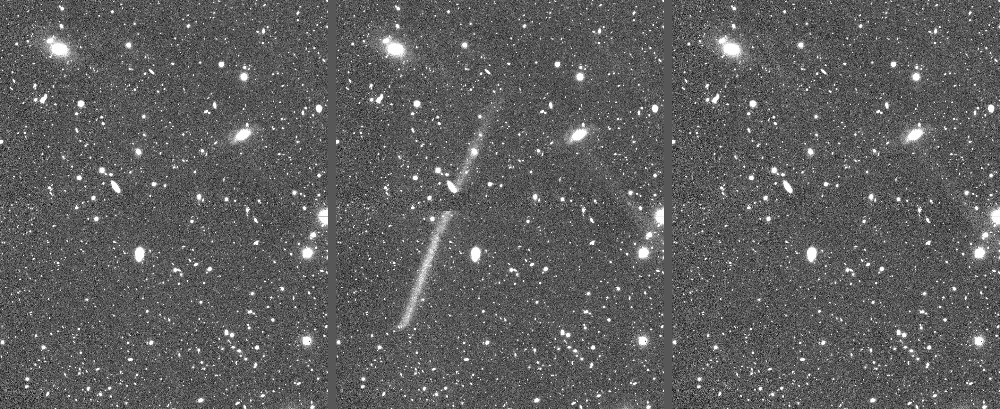

In [4]:
Image("safeclip2.png")  # from work by Bob Armstrong, on HSC data

## PSF-Matched Coaddition

Many of the problems of direct coaddition are the result of combining images with different PSFs.  Instead,
 - resample images to the same coordinate system
 - convolve each image with a kernel that transforms its PSF to a preselected common PSF
 - compute each coadd pixel as a weighted average of the input pixels

Here the loss of information is explicit, in the second step: we're degrading the best-seeing images to match the worst (or throwing out the worst images entirely).

## PSF-Matched Coaddition: Features

Correlations between pixels and boundary regions are even worse than with direct coadds, because of the extra convolution.

The PSF is continuous and well-defined everywhere (and probably constant, since we can choose it ourselves).

Noise properties still have discontinuities.

We can do any kind of clipping we want, without damaging the PSF.

If we match all bands to the same PSF, it's very straightforward to measure colors.

## PSF-Matched Coaddition: State of the Code

Nominally exists, but it's sufficiently broken that we haven't tried to use it in a long time:
 - the PSF-matching kernel is run before the resampling code, which then effectively *unmatches* the PSFs.  We could do the operation in this order instead, but we'd then have to match the per-epoch PSFs to an unwarped version of the target PSF.
 - we couldn't get reliable detections in the presence of the large noise correlations.

## Likelihood Coaddition

The optical way to combine data points isn't to average them; it's to multiply likelihoods - or add log-likelihoods.

 - resample images to the same coordinate system
 - compute $\Psi$ and $\Phi$ images for each resampled epoch image
   - account for pixel correlations due to resampling (not just a cross-correlation with the PSF)
   - treat masked pixels as having infinite variance
 - sum $\Psi$ and $\Phi$ separately

## Likelihood Coaddition: Also in Fourier Space

Likelihood coadds are essentially the same as "Kaiser coadds", which was a phrase tossed around DM quite a bit a few years ago.  That's in reference to an unpublished (and unfinished) Pan-STARRS technical report by Nick Kaiser that derives this approach from a different angle, in Fourier space, where it's motivated as an optimal weighting of the Fourier modes.  If you think naturally in Fourier space (I don't) that approach may make more sense, and it's quite possible that paper contains answers to some of the questions I'm about to bring up (and I've just failed to grasp them after reading it repeatedly).

## Likelihood Coaddition: User's Manual

 - We *can't* treat a likelihood just like another data image.  None of our current measurement algorithms are valid.
 
 - As a function of just the per-epoch PSFs, $\Phi$ is probably best treated as a lazily-evaluated field (like `CoaddPsf`) rather than an image.

 - If we just want to detect, we can use the coadded $\Psi$ and $\Phi$ in the same way we'd use single-epoch ones to form an image of the significance $\nu$, and just threshold on that.
 
 - By generalizing the model from a single point source to a superposition of many, we can also use $\Psi$ and $\Phi$ to create a likelihood image for arbitrary models - I think.


## Likelihood Coaddition: Features

 - No loss of information.
 
 - Correct handling of masked pixels (if we set their variances to infinite): they're simply not included in the likelihood.
 
 - No need to worry about correlated pixel noise in the result (there is no variance image accompanying the result).

## Likelihood Coaddition: What's the Catch?

We don't know.  They seem pretty great, but no one has ever implemented them at more than a toy-model level.

 - It might be too computationally expensive to create them correctly.
 
 - Algorithms for measurement and deblending might be too complex to be tractable, leaving them only useful for detection (I'm pretty confident they'll be useful for that).
 
 - Did Nick Kaiser give up on this idea (that'd be ominous), or just get bored with writing it up?

## Coadd Comparison
<br>

<div style="font-size:70%;">
<table class="tg">
  <tr>
    <th></th>
    <th style="text-align:center">Direct (No Rejection)</th>
    <th style="text-align:center">Direct (Clipping)</th>
    <th style="text-align:center">Direct (Masking)</th>
    <th style="text-align:center">PSF-Matched</th>
    <th style="text-align:center">Likelihood</th>
  </tr>
  <tr>
    <td>Correlated Noise</td>
    <td colspan="3" style="text-align:center">bad</td>
    <td style="text-align:center">very bad</td>
    <td style="text-align:center">NA</td>
  </tr>
  <tr>
    <td>PSF</td>
    <td style="text-align:center">discontinuous</td>
    <td style="text-align:center">undefined everywhere</td>
    <td style="text-align:center">undefined in masked regions</td>
    <td style="text-align:center">constant</td>
    <td style="text-align:center">NA</td>
  </tr>
  <tr>
    <td>Artifacts and Bad Pixels</td>
    <td style="text-align:center">fainter, but large area</td>
    <td style="text-align:center">mostly removed</td>
    <td style="text-align:center">removed from pixels, but still affect PSF</td>
    <td style="text-align:center">removed</td>
    <td style="text-align:center">removed</td>
  </tr>
  <tr>
    <td>information loss</td>
    <td colspan="3" style="text-align:center">impossible to optimize both PSF and depth</td>
    <td style="text-align:center">best images degraded, worst images dropped</td>
    <td style="text-align:center">none</td>
  </tr>
  <tr>
    <td>measurement algorithms</td>
    <td colspan="3" style="text-align:center">like single-epoch</td>
    <td style="text-align:center">like single-epoch, colors even easier</td>
    <td style="text-align:center">unknown</td>
  </tr>
</table>
</div>

## Building Coadds

We're probably going to have to build all of these coadds:
 - We'll use PSF-matched coadds for diffim templates, and maybe colors.
 - Users will want to be able to download direct coadds, and we may use them for deblending or measurements.
 - Likelihood coadds seem like the right way to do deep detection, and we may use them for deblending or measurements.

Most of the time in building a coadd is in the resampling and/or the convolution/correlation with the PSF or difference kernel.

 - If we're building many coadds from the same images, we probably want to resample them just once.

 - We might be able to combine the convolution/correlation step with the resampling step (both of these are dot products of the data with spatially-varying kernels).  This could save us from ever having to implement computing $\Psi$ with non-diagonal pixel covariance $C$. 

## The End!

Any questions on coaddition?

Or anything else?

(or any answers?)